#Cluster Analysis

- **Business Objective:** Creating clusters on global development measurement dataset
- **Data Set Details:**
The dataset has information about important economic and development metrics related to various countries across the globe.

- **Variable Description:**
Birth Rate, Business tax, CO2emissions, Country, Days to start business, Ease of business, energy usage, GDP, healthexp%GDP, healthexp/capita, hours to do tax, infant mortality, internet usage, lending rate, life expectancy female, etc.

**Acceptance Criterion:**
Work on different clustering models, do a comparative analysis and need to deploy the clustering application on streamlit, flask etc.
Milestones:
30 days to complete the Project


#Intial Observations
**The dataset contains the following variables related to global development metrics:**

1.	**Birth Rate**
2.	**Business Tax Rate** (with missing values)
3.	**CO2 Emissions**
4.	**Country**
5.	**Days to Start Business** (with missing values)
6.	**Ease of Business** (with missing values)
7.	**Energy Usage**
8.	**GDP** (formatted with currency symbols and commas)
9.	**Health Expenditure** (% GDP)
10.	**Health Expenditure per Capita** (formatted with currency symbols)
11.	**Life Expectancy** (Female and Male)
12.	**Mobile Phone Usage**
13.	**Number of Records**
14.	**Population Segmentation** (0-14, 15-64, 65+)
15.	**Population** (Total and Urban)
16.	**Tourism Inbound and Outbound** (formatted with currency symbols)


In [4]:
#Loading the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings('ignore')

### **Data Loading and Exploratory Data Analysis.**

In [8]:
#Load dataset
data_cluster = pd.read_excel("C:\P448 Clustering Global Development\World_development_mesurement (2).xlsx")
#First few rows
data_cluster.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [9]:
data_cluster.tail()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"
2703,0.011,NaN,NaN,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,...,76.0,NaN,1,0.206,0.641,0.152,105275,0.949,NaN,NaN


In [10]:
#last 5 rows
data_cluster.shape

(2704, 25)

In [11]:
data_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

**Observation:** In this dataset, we can see that some features have datatypes as objects because they either start with $ (e.g., GDP, Health Exp/Capita, Tourism Inbound, and Tourism Outbound) or end with % (e.g., Business Tax Rate). However, they should be of type float. Therefore, we need to convert them to float type.

In [12]:
df = data_cluster.copy()

In [13]:
# Function to convert dollar values to float
def convert_dollar_to_float(value):
    if isinstance(value, str) and value.startswith('$'):
        return float(value.replace('$', '').replace(',', ''))
    return value

# Function to convert percentage values to float
def convert_percent_to_float(value):
    if isinstance(value, str) and value.endswith('%'):
        return float(value.replace('%', '')) / 100
    return value

In [14]:
# Apply the conversion to the relevant columns
df['GDP'] = df['GDP'].apply(convert_dollar_to_float)
df['Health Exp/Capita'] = df['Health Exp/Capita'].apply(convert_dollar_to_float)
df['Tourism Inbound'] = df['Tourism Inbound'].apply(convert_dollar_to_float)
df['Tourism Outbound'] = df['Tourism Outbound'].apply(convert_dollar_to_float)
df['Business Tax Rate'] = df['Business Tax Rate'].apply(convert_percent_to_float)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   float64
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   float64
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   float64
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [ ]:
## Rename columns
df = df.rename(columns={'Birth Rate': 'BirthRate', 'Business Tax Rate': 'BusinessTaxRate','CO2 Emissions':'CO2Emissions','Days to Start Business':'DaystoStartBusiness','Ease of Business':'EaseofBusiness','Energy Usage':'EnergyUsage',
                            'Health Exp % GDP':'HealthExpGDP','Health Exp/Capita':'HealthExpCapita','Hours to do Tax':'HourstodoTax','Infant Mortality Rate':'InfantMortalityRate','Internet Usage':'InternetUsage','Lending Interest':'LendingInterest',
                            'Life Expectancy Female':'LifeExpectancyFemale','Life Expectancy Male':'LifeExpectancyMale','Mobile Phone Usage':'MobilePhoneUsage','Number of Records':'NumberofRecords','Population 0-14':'Population0to14',
                            'Population 15-64':'Population15to64','Population 65+':'Populationmorethan65','Population Total':'PopulationTotal','Population Urban':'PopulationUrban','Tourism Inbound':'TourismInbound','Tourism Outbound':'TourismOutbound'})
df.columns

Index(['BirthRate', 'BusinessTaxRate', 'CO2Emissions', 'Country',
       'DaystoStartBusiness', 'EaseofBusiness', 'EnergyUsage', 'GDP',
       'HealthExpGDP', 'HealthExpCapita', 'HourstodoTax',
       'InfantMortalityRate', 'InternetUsage', 'LendingInterest',
       'LifeExpectancyFemale', 'LifeExpectancyMale', 'MobilePhoneUsage',
       'NumberofRecords', 'Population0to14', 'Population15to64',
       'Populationmorethan65', 'PopulationTotal', 'PopulationUrban',
       'TourismInbound', 'TourismOutbound'],
      dtype='object')

In [ ]:
df['NumberofRecords'].value_counts()

NumberofRecords
1    2704
Name: count, dtype: int64

Since 'Number of Records' column has only only value, it does not provide any valuable insight hence excluding this column would be better.

In [ ]:
# remove the "Number of Records" column from your dataset
df = df.drop(columns=['NumberofRecords'])

In [ ]:
# Sum of Null Values
df.isnull().sum()

BirthRate                119
BusinessTaxRate         1281
CO2Emissions             579
Country                    0
DaystoStartBusiness      986
EaseofBusiness          2519
EnergyUsage              919
GDP                      210
HealthExpGDP             309
HealthExpCapita          309
HourstodoTax            1288
InfantMortalityRate      260
InternetUsage            173
LendingInterest          824
LifeExpectancyFemale     136
LifeExpectancyMale       136
MobilePhoneUsage         167
Population0to14          220
Population15to64         220
Populationmorethan65     220
PopulationTotal            0
PopulationUrban           26
TourismInbound           368
TourismOutbound          471
dtype: int64

In [3]:
df.head()

NameError: name 'df' is not defined

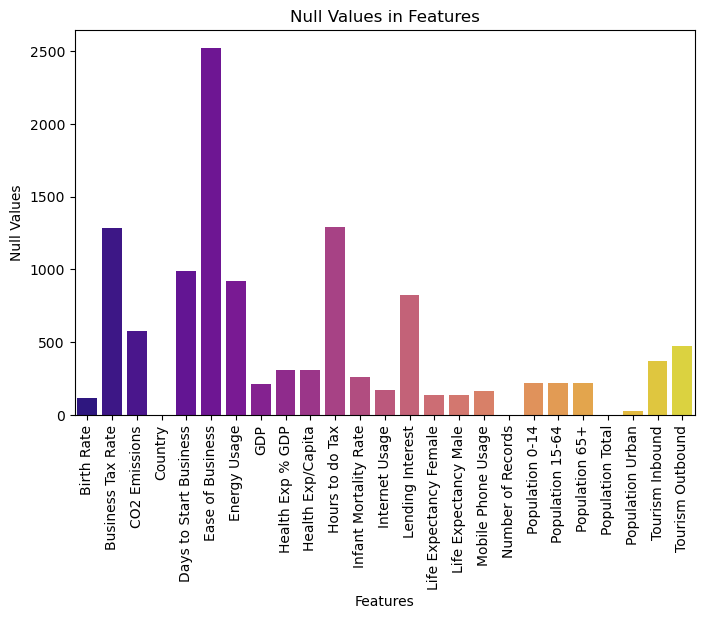

In [ ]:
null = data_cluster.isnull().sum()

# Plot of Missing Values
plt.figure(figsize=(8, 5))
sns.barplot(x=null.index, y=null, palette='plasma')
plt.xlabel('Features')
plt.ylabel('Null Values')
plt.title('Null Values in Features')
plt.xticks(rotation=90)
plt.show()

The above plot shows that the most of the features in the data contains significant NaN values and treating them is needed. Ease of Business column contains 2519 missing values, hence exluding this column from the data would be better for further analysis.

In [ ]:
# finding the duplicate values in the dataset
df.duplicated().sum()

0

In [ ]:
# Dataset summary
df.describe()

,BirthRate,BusinessTaxRate,CO2Emissions,DaystoStartBusiness,EaseofBusiness,EnergyUsage,GDP,HealthExpGDP,HealthExpCapita,HourstodoTax,...,LifeExpectancyFemale,LifeExpectancyMale,MobilePhoneUsage,Population0to14,Population15to64,Populationmorethan65,PopulationTotal,PopulationUrban,TourismInbound,TourismOutbound
count,2585.000000,1423.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2.494000e+03,2395.000000,2395.000000,1416.000000,...,2568.000000,2568.000000,2537.000000,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000,2.336000e+03,2.233000e+03
mean,0.022715,0.489669,1.423071e+05,39.999418,94.875676,7.723684e+04,2.638540e+11,0.064170,801.397077,302.068503,...,71.159268,66.461838,0.578124,0.303051,0.623481,0.073465,3.145729e+07,0.562953,4.939320e+09,4.729435e+09
std,0.011338,0.409541,6.159288e+05,57.318588,54.791906,2.599239e+05,1.129910e+12,0.026325,1473.448036,273.299686,...,10.708262,9.390217,0.474647,0.106577,0.069660,0.049541,1.242894e+08,0.245897,1.385098e+10,1.326774e+10
min,0.007000,0.082000,7.000000e+00,1.000000,1.000000,8.000000e+00,6.310127e+07,0.008000,2.000000,12.000000,...,39.000000,37.000000,0.000000,0.118000,0.474000,0.003000,1.887600e+04,0.082000,7.000000e+05,2.000000e+05
25%,0.013000,0.324000,1.360000e+03,13.000000,48.000000,3.737000e+03,3.539042e+09,0.046000,50.000000,156.000000,...,64.000000,61.000000,0.100000,0.204750,0.559000,0.033000,8.783360e+05,0.356000,1.250000e+08,1.100000e+08
50%,0.020000,0.410000,8.529000e+03,26.000000,94.000000,1.433800e+04,1.507975e+10,0.061000,193.000000,239.000000,...,75.000000,69.000000,0.500000,0.299500,0.642500,0.052000,5.800324e+06,0.560000,6.885000e+08,4.560000e+08
75%,0.031000,0.515500,5.910800e+04,45.000000,142.000000,4.185200e+04,1.102047e+11,0.079000,665.000000,344.750000,...,79.000000,73.250000,0.900000,0.402000,0.676000,0.112000,2.014089e+07,0.765000,3.601500e+09,2.842000e+09
max,0.053000,3.391000,8.286892e+06,694.000000,189.000000,2.727728e+06,1.624460e+13,0.225000,9908.000000,2600.000000,...,87.000000,88.000000,2.900000,0.500000,0.858000,0.244000,1.350695e+09,1.000000,2.000920e+11,1.265730e+11


In [ ]:
# Extracting Numerical Values
numerical_df = df.select_dtypes(include=['number'])

**Histogram**

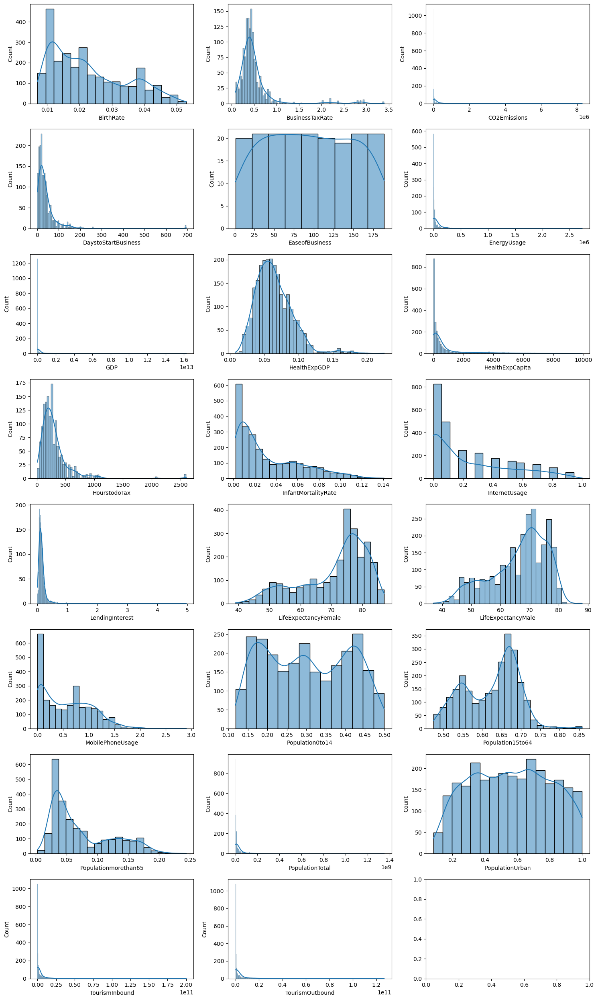

In [ ]:
# Create subplots
fig, axes = plt.subplots(8, 3, figsize=(15, 25))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate through numerical columns and plot
for i, col in enumerate(numerical_df):
    sns.histplot(numerical_df[col], kde=True, ax=axes[i])
    #axes[i].set_title(col)

# Adjust layout
plt.tight_layout()
plt.show()

***Histogram Insights***

The histograms illustrate the distribution of various demographic and economic indicators, revealing several key patterns:

1. **BirthRate**: The distribution is right-skewed, indicating that a majority of countries have lower birth rates, with fewer countries having higher rates.

2. **BusinessTaxRate**: This variable shows a more uniform distribution, suggesting variability among countries regarding their tax rates.

3. **DaystoStartaBusiness**: The distribution is heavily skewed to the left, indicating that most countries require fewer days to establish a business, while some have significantly longer durations.

4. **EaseofBusiness**: This indicator also appears relatively uniform, indicating diverse experiences in starting and operating businesses across different countries.

5. **GDP**: The distribution is highly right-skewed, showing a concentration of lower GDP values and a few countries with extremely high GDPs.

6. **HealthExpGDP**: This variable has a somewhat normal distribution but with more concentration towards the lower end, indicating that many countries spend a smaller percentage of their GDP on health.

7. **InfantMortalityRate**: The histogram is left-skewed, indicating that most countries experience lower infant mortality rates, with only a few countries facing significantly higher rates.

8. **LifeExpectancy**: The distributions for both females and males exhibit a slight right skew, suggesting that most individuals live into their 70s and 80s.

9. **PopulationDistribution**: The population categories (0-14 years, 15-64 years, and 65+) exhibit right-skewed distributions, indicating that the majority of the population in most countries is within the younger age ranges.

10. **TourismInbound/Outbound**: Both indicators show a significant right skew, indicating a few countries receive or generate a disproportionately high level of tourism compared to the majority.

Overall, these distributions highlight significant disparities across countries in terms of economic performance, health outcomes, and demographic factors, which may warrant further investigation and targeted policy interventions.


**Box Plots**

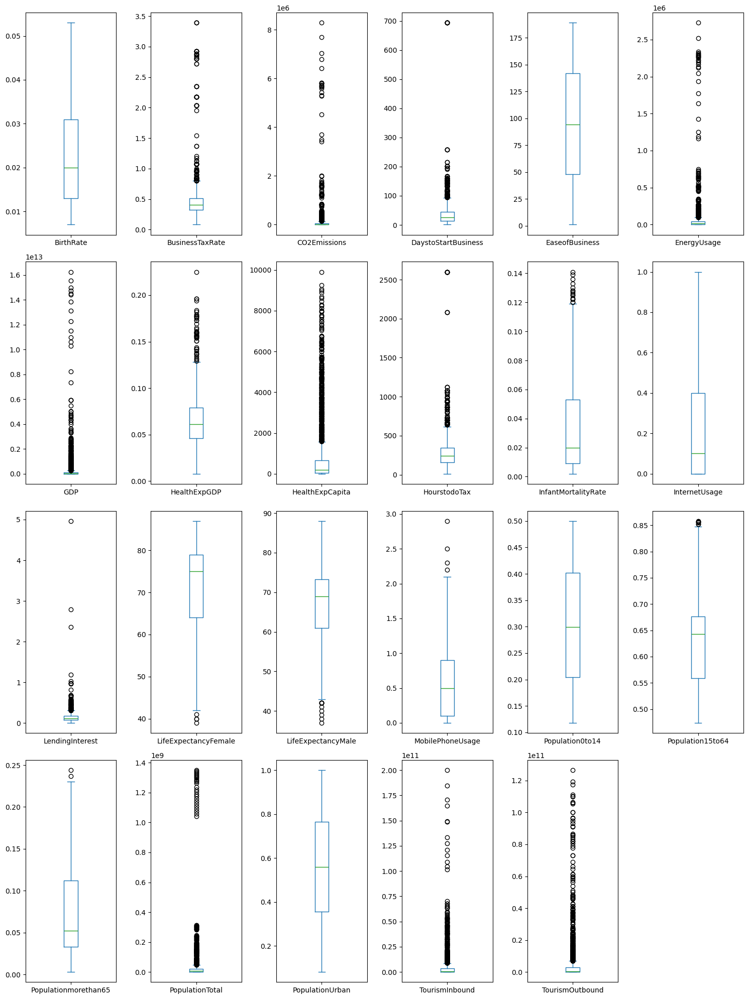

In [ ]:
# Box plots
numerical_df.plot(kind='box', subplots=True, layout=(4, 6), figsize=(15, 20), sharex=False, sharey=False)
plt.tight_layout()
plt.show()

**Correlation Matrix**

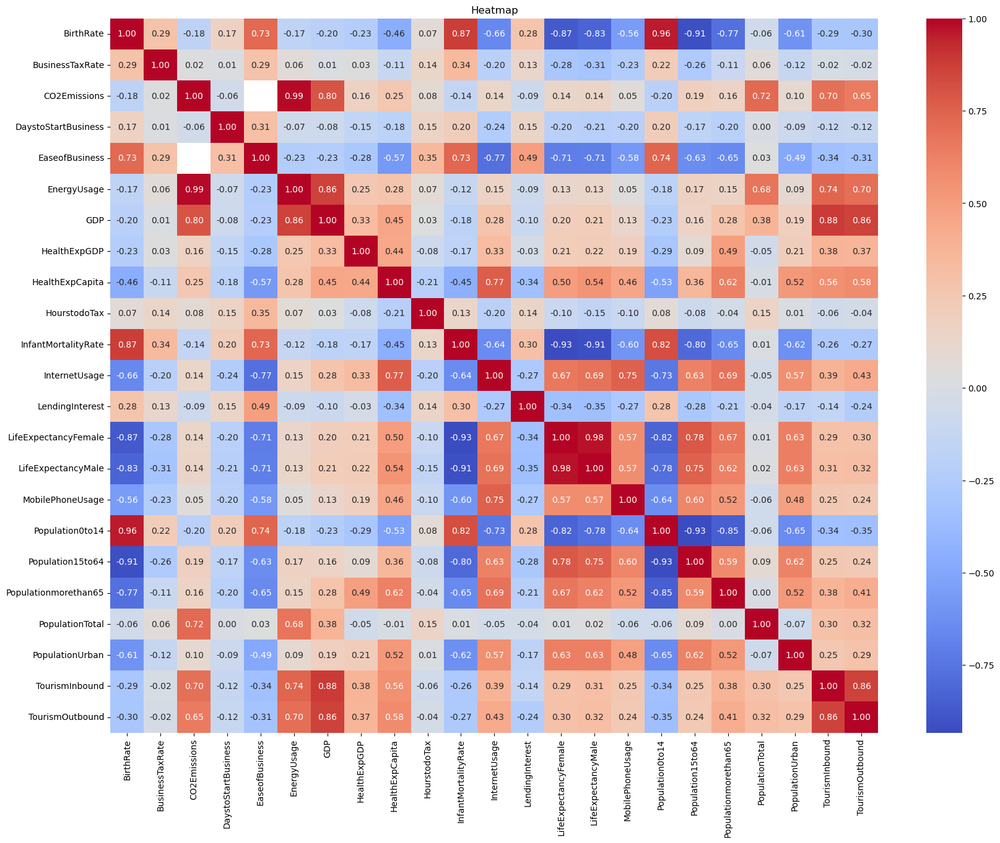

In [ ]:
corr = df.corr(numeric_only=True)

# Heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(corr,annot=True,fmt=".2f", cmap='coolwarm')
plt.title("Heatmap")
plt.show()

***Correlation Matrix Insights***

The correlation matrix provides insights into the relationships between various demographic and economic indicators. Here are some key observations:

- **Birth Rate** shows a strong positive correlation with **Ease of Business** (0.73) and **Infant Mortality Rate** (0.87), indicating that higher ease in conducting business is associated with higher birth rates, while higher infant mortality correlates negatively.
  
- **Business Tax Rate** has a weak correlation with most indicators, highlighting that it may not significantly influence economic conditions in this dataset.

- **CO2 Emissions** and **Energy Usage** are highly correlated (0.99), suggesting that increased energy consumption directly impacts CO2 emissions.

- **Health Expenditure as a percentage of GDP** negatively correlates with several indicators, including **Life Expectancy for Females** (-0.87) and **Males** (-0.83), implying that lower health spending may correlate with poorer health outcomes.

- **Internet Usage** has a negative correlation with **Infant Mortality Rate** (-0.64), suggesting that higher internet access may contribute to better health outcomes, possibly through improved access to information.

- **Life Expectancy** for both genders has strong negative correlations with **Infant Mortality Rate**, emphasizing that lower infant mortality rates lead to higher life expectancy.

Overall, the correlation matrix reveals complex interdependencies among health, economic conditions, and demographic factors, highlighting areas for potential policy focus and further analysis.


**Variables Pairplots**

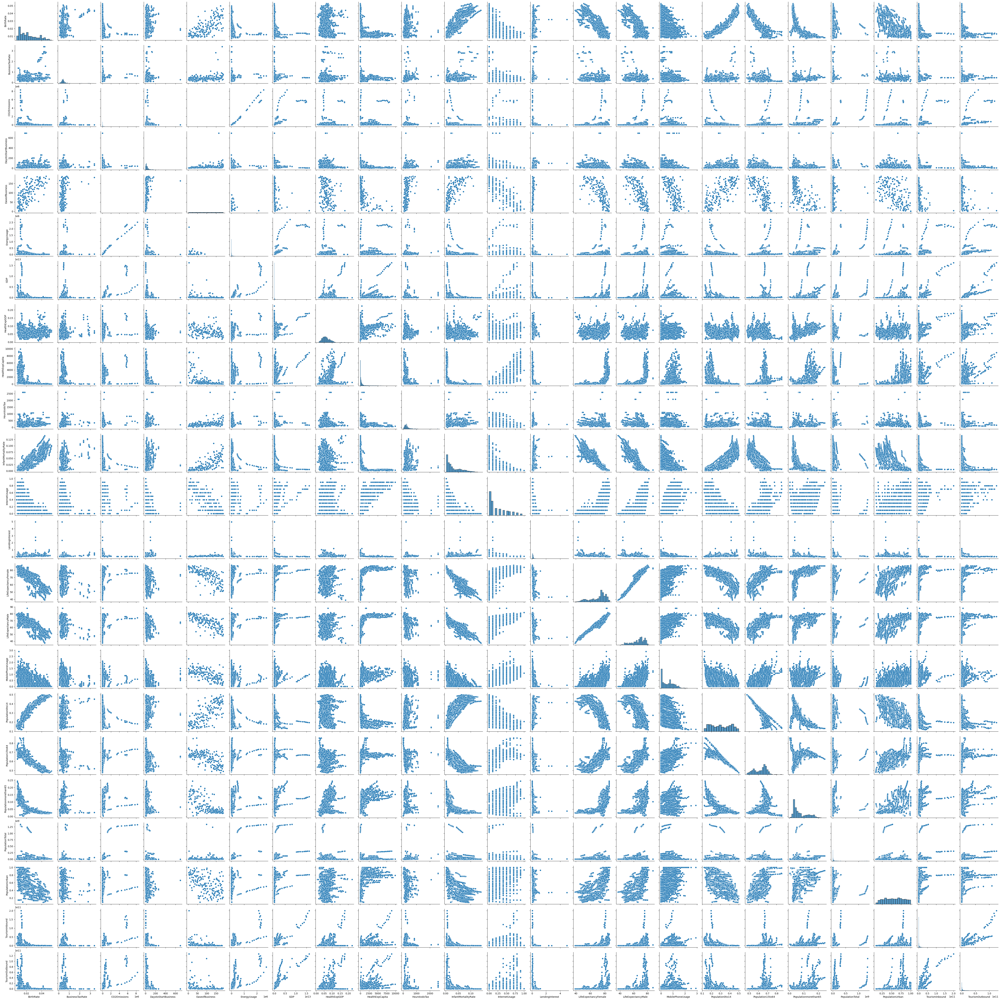

In [ ]:
# Pair plot for numerical features
sns.pairplot(numerical_df)
plt.show()

In [ ]:
# Value Counts of Country
df['Country'].value_counts()

Country
Algeria                  13
Angola                   13
Turkey                   13
Ukraine                  13
United Kingdom           13
                         ..
Malaysia                 13
Maldives                 13
Mongolia                 13
Myanmar                  13
Virgin Islands (U.S.)    13
Name: count, Length: 208, dtype: int64

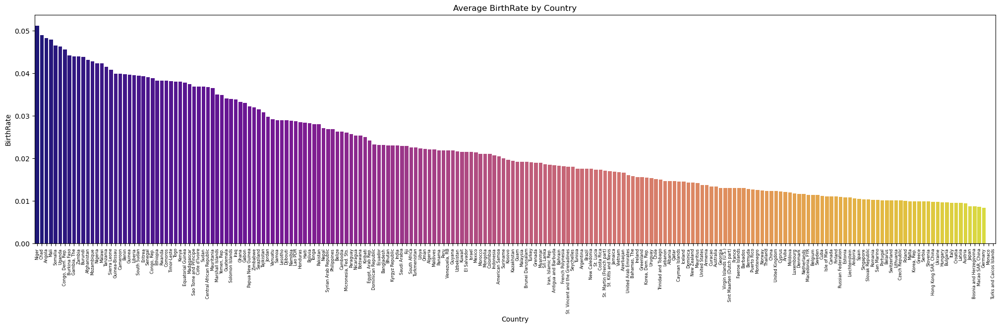

In [ ]:
# Bar plot
avg_birth_rate = df.groupby('Country')['BirthRate'].mean().reset_index()

# Sort the DataFrame by 'Birth Rate' in descending order
avg_birth_rate = avg_birth_rate.sort_values(by='BirthRate', ascending=False)

# Plot
plt.figure(figsize=(25, 6))
sns.barplot(x='Country', y='BirthRate', data=avg_birth_rate, palette='plasma')
plt.xticks(rotation=90, fontsize=6)
plt.title('Average BirthRate by Country')
plt.show()

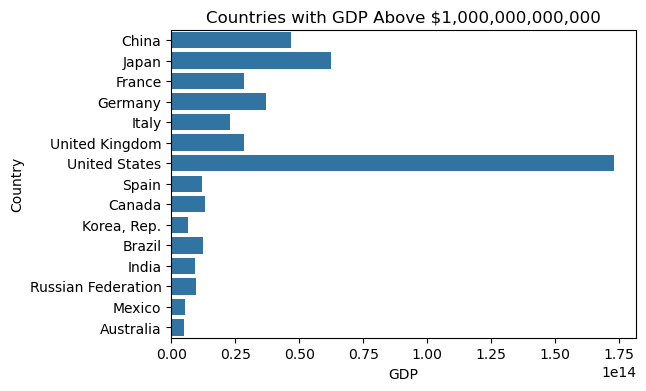

In [ ]:
# Filter the dataset for countries with GDP > 1e+12
filtered_df = df[df['GDP'] > 1e+12]

# Bar plot for countries with GDP > $1,000,000,000,000
plt.figure(figsize=(6, 4))
sns.barplot(x='GDP', y='Country', data=filtered_df, estimator=sum, ci=None)
plt.title('Countries with GDP Above $1,000,000,000,000')
plt.xlabel('GDP')
plt.ylabel('Country')
plt.show()

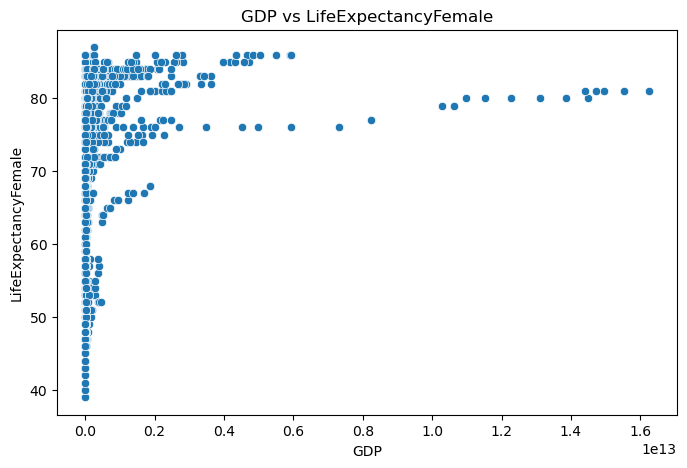

In [ ]:
# GDP vs Life Expectancy Female
plt.figure(figsize=(8, 5))
sns.scatterplot(x='GDP', y='LifeExpectancyFemale', data=df)
plt.title('GDP vs LifeExpectancyFemale')
plt.xlabel('GDP')
plt.ylabel('LifeExpectancyFemale')
plt.show()

### **Data Preprocessing**
We need to process the data for model building

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer

#### 1. Handling Missing Values

In [ ]:
df.isnull().sum()

BirthRate                119
BusinessTaxRate         1281
CO2Emissions             579
Country                    0
DaystoStartBusiness      986
EaseofBusiness          2519
EnergyUsage              919
GDP                      210
HealthExpGDP             309
HealthExpCapita          309
HourstodoTax            1288
InfantMortalityRate      260
InternetUsage            173
LendingInterest          824
LifeExpectancyFemale     136
LifeExpectancyMale       136
MobilePhoneUsage         167
Population0to14          220
Population15to64         220
Populationmorethan65     220
PopulationTotal            0
PopulationUrban           26
TourismInbound           368
TourismOutbound          471
dtype: int64

**a. Drop Columns with Excessive Missing Values** <br>
We can remove Ease of Business since it has 2519 missing values. Business Tax Rate and Hours to do Tax have around 50% missing values, so we are dropping these columns.

In [ ]:
# remove the "Ease of Business" column from your dataset
df.drop(columns=['BusinessTaxRate', 'EaseofBusiness', 'HourstodoTax'], inplace=True)

**b. Imputation Based on Statistical Methods**<br>
Birth Rate,
GDP,
Health Exp % GDP,
Health Exp/Capita,
Infant Mortality Rate,
Internet Usage,
Life Expectancy Female,
Life Expectancy Male,
Mobile Phone Usage,
Population 0-14,
Population 15-64,
Population 65+,
Population Urban columns are filled with the mean or median.

In [ ]:
# List of columns to impute
columns_to_impute = [
    'BirthRate', 'GDP', 'HealthExpGDP', 'HealthExpCapita',
    'InfantMortalityRate', 'InternetUsage', 'LifeExpectancyFemale',
    'LifeExpectancyMale', 'MobilePhoneUsage', 'Population0to14',
    'Population15to64', 'Populationmorethan65', 'PopulationUrban'
]

# Impute using mean for numeric columns
for column in columns_to_impute:
    if df[column].isnull().any():  # Check if there are nulls in the column
        df[column].fillna(df[column].mean(), inplace=True)  # Replace NaNs with the mean

**c. Machine learning models for imputation**<br>
To impute the columns with significant missing values (Days to Start Business, Energy Usage, Lending Interest, Tourism Outbound, Tourism Inbound, and CO2 Emissions), we used various machine learning models for imputation.

In [ ]:
# Define columns with significant missing values
columns_to_impute = [
    'DaystoStartBusiness',
    'EnergyUsage',
    'LendingInterest',
    'TourismOutbound',
    'TourismInbound',
    'CO2Emissions',
]

In [ ]:
# Create a KNN imputer
imputer = KNNImputer(n_neighbors=5)

# Select only the columns we want to impute
# It's good practice to drop columns with too many missing values before imputation
impute_data = df[columns_to_impute]

# Perform KNN imputation
imputed_data = imputer.fit_transform(impute_data)

# Update the original DataFrame with the imputed values
df[columns_to_impute] = imputed_data

In [ ]:
# This is how the data looks after handling null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   BirthRate             2704 non-null   float64
 1   CO2Emissions          2704 non-null   float64
 2   Country               2704 non-null   object 
 3   DaystoStartBusiness   2704 non-null   float64
 4   EnergyUsage           2704 non-null   float64
 5   GDP                   2704 non-null   float64
 6   HealthExpGDP          2704 non-null   float64
 7   HealthExpCapita       2704 non-null   float64
 8   InfantMortalityRate   2704 non-null   float64
 9   InternetUsage         2704 non-null   float64
 10  LendingInterest       2704 non-null   float64
 11  LifeExpectancyFemale  2704 non-null   float64
 12  LifeExpectancyMale    2704 non-null   float64
 13  MobilePhoneUsage      2704 non-null   float64
 14  Population0to14       2704 non-null   float64
 15  Population15to64     

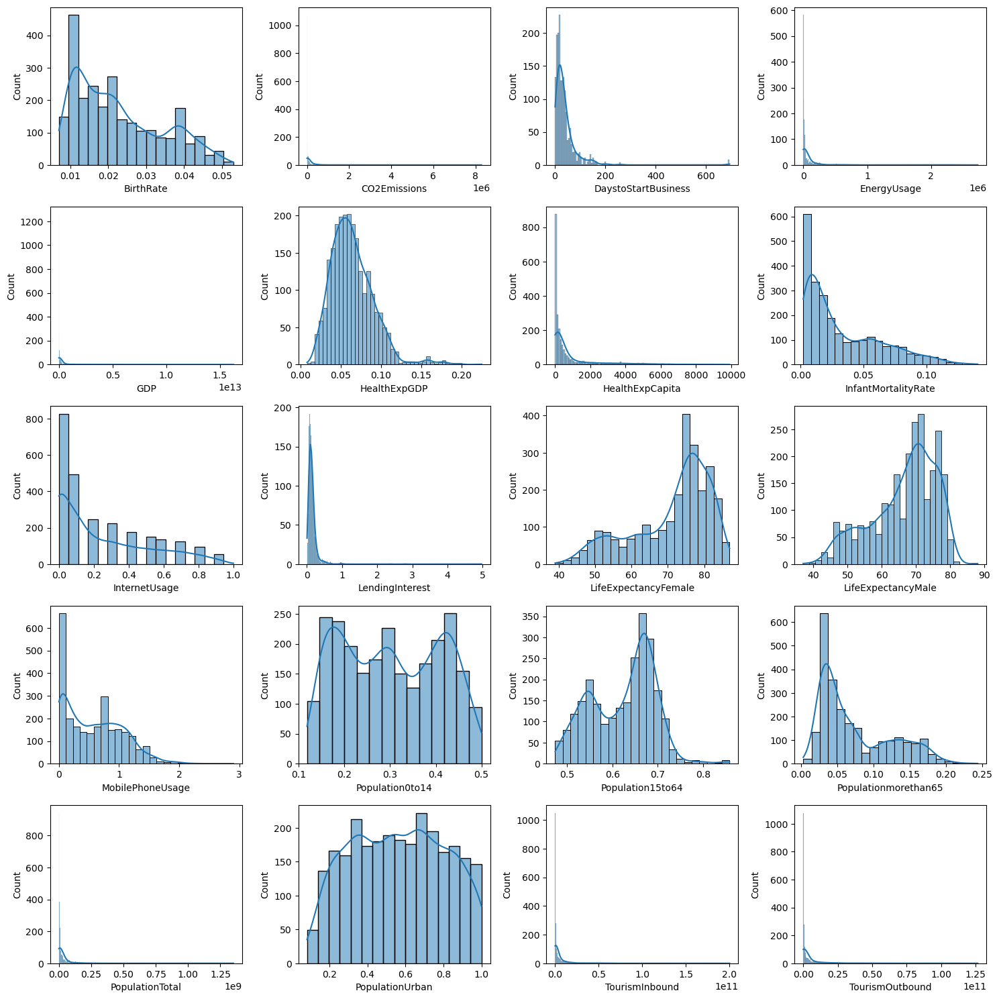

In [ ]:
num_df = df.select_dtypes(include=['number'])
# Create subplots
fig, axes = plt.subplots(5, 4, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate through numerical columns and plot
for i, col in enumerate(num_df):
    sns.histplot(numerical_df[col], kde=True, ax=axes[i])
    #axes[i].set_title(col)

# Adjust layout
plt.tight_layout()
plt.show()

#### 2. Treating Outliers

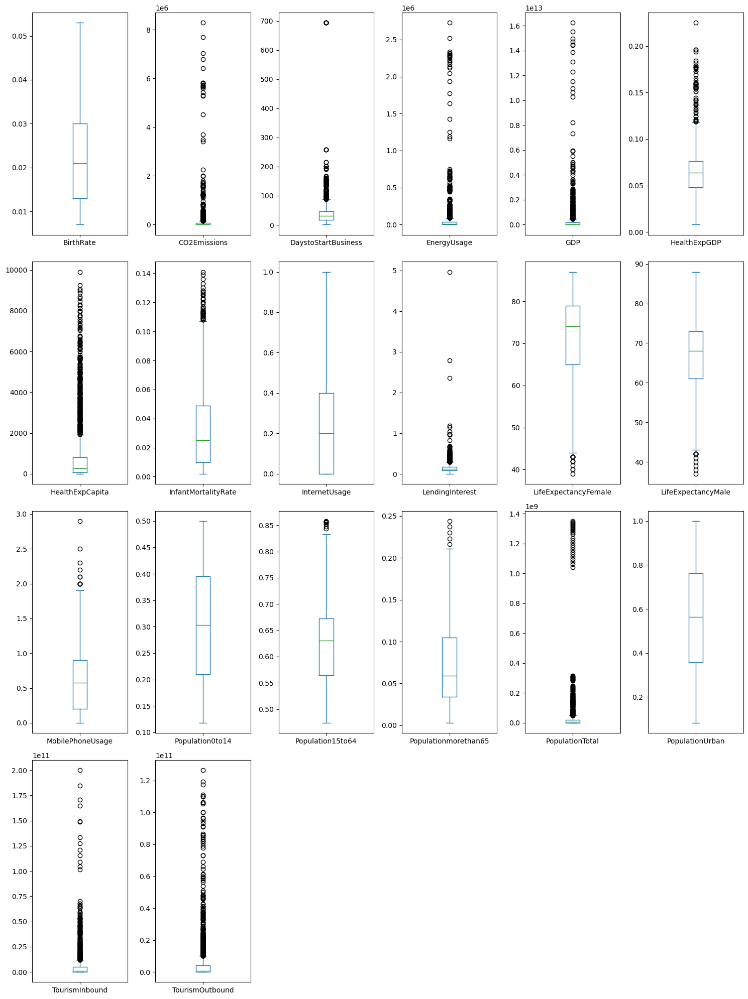

In [ ]:
# Box Plot After imputing null values
num_df.plot(kind='box', subplots=True, layout=(4, 6), figsize=(15, 20), sharex=False, sharey=False)
plt.tight_layout()
plt.show()

In [ ]:
df.shape

(2704, 21)

In [ ]:
df

,BirthRate,CO2Emissions,Country,DaystoStartBusiness,EnergyUsage,GDP,HealthExpGDP,HealthExpCapita,InfantMortalityRate,InternetUsage,...,LifeExpectancyFemale,LifeExpectancyMale,MobilePhoneUsage,Population0to14,Population15to64,Populationmorethan65,PopulationTotal,PopulationUrban,TourismInbound,TourismOutbound
0,0.020000,87931.000000,Algeria,47.600000,2.699800e+04,5.479006e+10,0.03500,60.000000,0.034000,0.000000,...,71.000000,67.000000,0.000000,0.342000,0.619000,0.039000,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050000,9542.000000,Angola,16.600000,7.499000e+03,9.129595e+09,0.03400,22.000000,0.128000,0.000000,...,47.000000,44.000000,0.000000,0.476000,0.499000,0.025000,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043000,1617.000000,Benin,72.000000,1.983000e+03,2.359122e+09,0.04300,15.000000,0.090000,0.000000,...,57.000000,53.000000,0.000000,0.454000,0.517000,0.029000,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027000,4276.000000,Botswana,36.200000,1.836000e+03,5.788312e+09,0.04700,152.000000,0.054000,0.000000,...,52.000000,49.000000,0.100000,0.383000,0.587000,0.029000,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046000,1041.000000,Burkina Faso,54.000000,7.793600e+03,2.610959e+09,0.05100,12.000000,0.096000,0.000000,...,52.000000,49.000000,0.000000,0.468000,0.505000,0.028000,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.022715,142307.107765,Turks and Caicos Islands,39.999418,7.723684e+04,2.638540e+11,0.06417,801.397077,0.032813,0.239747,...,71.159268,66.461838,0.578124,0.303051,0.623481,0.073465,32427,0.911,4.939320e+09,4.729435e+09
2700,0.013000,581.400000,United States,5.000000,2.132446e+06,1.624460e+13,0.17900,8895.000000,0.006000,0.800000,...,81.000000,76.000000,1.000000,0.196000,0.667000,0.136000,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015000,41249.400000,Uruguay,7.000000,1.099160e+04,5.000435e+10,0.08900,1308.000000,0.010000,0.500000,...,80.000000,74.000000,1.500000,0.220000,0.639000,0.140000,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020000,1436.800000,"Venezuela, RB",144.000000,7.626600e+03,3.812862e+11,0.04600,593.000000,0.013000,0.500000,...,78.000000,72.000000,1.000000,0.288000,0.652000,0.060000,29954782,0.889,9.040000e+08,3.202000e+09


In [ ]:
print("Missing Values per column:\n", df.isnull().sum())

Missing Values per column:
 BirthRate               0
CO2Emissions            0
Country                 0
DaystoStartBusiness     0
EnergyUsage             0
GDP                     0
HealthExpGDP            0
HealthExpCapita         0
InfantMortalityRate     0
InternetUsage           0
LendingInterest         0
LifeExpectancyFemale    0
LifeExpectancyMale      0
MobilePhoneUsage        0
Population0to14         0
Population15to64        0
Populationmorethan65    0
PopulationTotal         0
PopulationUrban         0
TourismInbound          0
TourismOutbound         0
dtype: int64


In [ ]:
# Handle missing values for numeric columns only
# 1. Select numeric columns (ignoring non-numeric columns like 'Country')
numeric_cols = df.select_dtypes(include=[np.number]).columns

In [ ]:
# 2. Fill missing values with the median for numeric columns only
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())

In [ ]:
# Example: Convert percentage columns (like 'healthexp%GDP') to numeric if necessary
# Replace 'healthexp%GDP' with the actual column name having percentage data
# df['healthexp%GDP'] = df['healthexp%GDP'].str.rstrip('%').astype('float') / 100

# Check again for missing values
print("Missing values after imputation:\n", df.isnull().sum())


Missing values after imputation:
 BirthRate               0
CO2Emissions            0
Country                 0
DaystoStartBusiness     0
EnergyUsage             0
GDP                     0
HealthExpGDP            0
HealthExpCapita         0
InfantMortalityRate     0
InternetUsage           0
LendingInterest         0
LifeExpectancyFemale    0
LifeExpectancyMale      0
MobilePhoneUsage        0
Population0to14         0
Population15to64        0
Populationmorethan65    0
PopulationTotal         0
PopulationUrban         0
TourismInbound          0
TourismOutbound         0
dtype: int64


In [ ]:
# Select only numeric columns for correlation and clustering
numeric_df = df[numeric_cols]

# Scaling

#### Scaling is a technique to standardize the independent features present in the data in a fixed range. We do this to make sure all the features are in same scale.

There are two types of scaling
1. Standard Scaling
2. MinMax Scaling

Here we will be using Standard Scaler

In [ ]:
# Standardization (scaling the features to make them comparable)
scaler = StandardScaler()
df_scaled = scaler.fit_transform(numeric_df)

In [ ]:
## Standardization of data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit_transform(numeric_df)

array([[-2.44938515e-01, -6.93650064e-02,  1.75408965e-01, ...,
         1.47332941e-01, -3.83556635e-01, -3.67301477e-01],
       [ 2.46167047e+00, -2.11581757e-01, -4.84707641e-01, ...,
        -9.76646386e-01, -3.88741737e-01, -3.71093606e-01],
       [ 1.83012837e+00, -2.25959638e-01,  6.94984616e-01, ...,
        -7.35501730e-01, -3.85462922e-01, -3.78839232e-01],
       ...,
       [-6.96040012e-01, -1.54056806e-01, -6.89130848e-01, ...,
         1.57376489e+00, -2.21903458e-01, -2.99930668e-01],
       [-2.44938515e-01, -2.26286565e-01,  2.22815867e+00, ...,
         1.33262023e+00, -3.22402933e-01, -1.24524516e-01],
       [-1.05692121e+00,  2.92865051e-02,  1.35615314e-02, ...,
         1.57785208e+00, -1.47037168e-02, -1.28557379e-03]])

In [ ]:
x = sc.fit_transform(numeric_df)
x

array([[-2.44938515e-01, -6.93650064e-02,  1.75408965e-01, ...,
         1.47332941e-01, -3.83556635e-01, -3.67301477e-01],
       [ 2.46167047e+00, -2.11581757e-01, -4.84707641e-01, ...,
        -9.76646386e-01, -3.88741737e-01, -3.71093606e-01],
       [ 1.83012837e+00, -2.25959638e-01,  6.94984616e-01, ...,
        -7.35501730e-01, -3.85462922e-01, -3.78839232e-01],
       ...,
       [-6.96040012e-01, -1.54056806e-01, -6.89130848e-01, ...,
         1.57376489e+00, -2.21903458e-01, -2.99930668e-01],
       [-2.44938515e-01, -2.26286565e-01,  2.22815867e+00, ...,
         1.33262023e+00, -3.22402933e-01, -1.24524516e-01],
       [-1.05692121e+00,  2.92865051e-02,  1.35615314e-02, ...,
         1.57785208e+00, -1.47037168e-02, -1.28557379e-03]])

In [ ]:
df_new = pd.DataFrame(x, columns=df.columns[:x.shape[1]])
df

,BirthRate,CO2Emissions,Country,DaystoStartBusiness,EnergyUsage,GDP,HealthExpGDP,HealthExpCapita,InfantMortalityRate,InternetUsage,...,LifeExpectancyFemale,LifeExpectancyMale,MobilePhoneUsage,Population0to14,Population15to64,Populationmorethan65,PopulationTotal,PopulationUrban,TourismInbound,TourismOutbound
0,0.020000,87931.000000,Algeria,47.600000,2.699800e+04,5.479006e+10,0.03500,60.000000,0.034000,0.000000,...,71.000000,67.000000,0.000000,0.342000,0.619000,0.039000,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050000,9542.000000,Angola,16.600000,7.499000e+03,9.129595e+09,0.03400,22.000000,0.128000,0.000000,...,47.000000,44.000000,0.000000,0.476000,0.499000,0.025000,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043000,1617.000000,Benin,72.000000,1.983000e+03,2.359122e+09,0.04300,15.000000,0.090000,0.000000,...,57.000000,53.000000,0.000000,0.454000,0.517000,0.029000,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027000,4276.000000,Botswana,36.200000,1.836000e+03,5.788312e+09,0.04700,152.000000,0.054000,0.000000,...,52.000000,49.000000,0.100000,0.383000,0.587000,0.029000,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046000,1041.000000,Burkina Faso,54.000000,7.793600e+03,2.610959e+09,0.05100,12.000000,0.096000,0.000000,...,52.000000,49.000000,0.000000,0.468000,0.505000,0.028000,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.022715,142307.107765,Turks and Caicos Islands,39.999418,7.723684e+04,2.638540e+11,0.06417,801.397077,0.032813,0.239747,...,71.159268,66.461838,0.578124,0.303051,0.623481,0.073465,32427,0.911,4.939320e+09,4.729435e+09
2700,0.013000,581.400000,United States,5.000000,2.132446e+06,1.624460e+13,0.17900,8895.000000,0.006000,0.800000,...,81.000000,76.000000,1.000000,0.196000,0.667000,0.136000,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015000,41249.400000,Uruguay,7.000000,1.099160e+04,5.000435e+10,0.08900,1308.000000,0.010000,0.500000,...,80.000000,74.000000,1.500000,0.220000,0.639000,0.140000,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020000,1436.800000,"Venezuela, RB",144.000000,7.626600e+03,3.812862e+11,0.04600,593.000000,0.013000,0.500000,...,78.000000,72.000000,1.000000,0.288000,0.652000,0.060000,29954782,0.889,9.040000e+08,3.202000e+09


In [ ]:
df.columns

Index(['BirthRate', 'CO2Emissions', 'Country', 'DaystoStartBusiness',
       'EnergyUsage', 'GDP', 'HealthExpGDP', 'HealthExpCapita',
       'InfantMortalityRate', 'InternetUsage', 'LendingInterest',
       'LifeExpectancyFemale', 'LifeExpectancyMale', 'MobilePhoneUsage',
       'Population0to14', 'Population15to64', 'Populationmorethan65',
       'PopulationTotal', 'PopulationUrban', 'TourismInbound',
       'TourismOutbound'],
      dtype='object')

In [ ]:
scaled_data = pd.DataFrame(x, columns=df.columns[:x.shape[1]])
scaled_data

,BirthRate,CO2Emissions,Country,DaystoStartBusiness,EnergyUsage,GDP,HealthExpGDP,HealthExpCapita,InfantMortalityRate,InternetUsage,LendingInterest,LifeExpectancyFemale,LifeExpectancyMale,MobilePhoneUsage,Population0to14,Population15to64,Populationmorethan65,PopulationTotal,PopulationUrban,TourismInbound
0,-0.244939,-0.069365,0.175409,-0.161951,-1.926981e-01,-1.177630e+00,-0.534758,4.167121e-02,-9.528029e-01,-0.326733,-1.526510e-02,0.058820,-1.257704,0.381370,-0.067135,-7.259726e-01,0.002110,0.147333,-0.383557,-0.367301
1,2.461670,-0.211582,-0.484708,-0.252043,-2.347842e-01,-1.218002e+00,-0.562167,3.341698e+00,-9.528029e-01,6.018976,-2.315556e+00,-2.455048,-1.257704,1.693440,-1.864811,-1.020873e+00,-0.141087,-0.976646,-0.388742,-0.371094
2,1.830128,-0.225960,0.694985,-0.277528,-2.410247e-01,-8.546543e-01,-0.567216,2.007645e+00,-9.528029e-01,0.196175,-1.357101e+00,-1.471361,-1.257704,1.478026,-1.595159,-9.366158e-01,-0.197221,-0.735502,-0.385463,-0.378839
3,0.386604,-0.221136,-0.067344,-0.278207,-2.378639e-01,-6.931666e-01,-0.468400,7.438046e-01,-9.528029e-01,0.047746,-1.836328e+00,-1.908555,-1.040155,0.782825,-0.546515,-9.366158e-01,-0.239018,-0.126509,-0.374025,-0.366011
4,2.100789,-0.227005,0.311691,-0.250681,-2.407925e-01,-5.316789e-01,-0.569380,2.218285e+00,-9.528029e-01,0.464438,-1.836328e+00,-1.908555,-1.257704,1.615108,-1.774927,-9.576801e-01,-0.159732,-1.573377,-0.389581,-0.380453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.000000,0.029287,0.013562,0.070168,2.812861e-17,-5.602730e-16,0.000000,-2.436015e-16,-1.103062e-16,0.000784,1.362046e-15,0.000000,0.000000,0.000000,0.000000,-2.923261e-16,-0.252883,1.422539,-0.014704,-0.001286
2700,-0.876481,-0.227838,-0.731719,9.565863,1.472975e+01,4.635928e+00,5.837788,-9.413155e-01,2.226557e+00,-0.782916,9.431892e-01,1.042508,0.917789,-1.048198,0.651935,1.317266e+00,2.272669,1.013819,14.865981,9.829492
2701,-0.696040,-0.154057,-0.689131,-0.235906,-1.971092e-01,1.002454e+00,0.365405,-8.008889e-01,1.034297e+00,-0.245028,8.473438e-01,0.823911,2.005535,-0.813200,0.232477,1.401523e+00,-0.225822,1.573765,-0.221903,-0.299931
2702,-0.244939,-0.226287,2.228159,-0.251453,1.082394e-01,-7.335385e-01,-0.150314,-6.955688e-01,1.034297e+00,0.109024,6.556529e-01,0.605314,0.917789,-0.147374,0.427225,-2.836220e-01,-0.012091,1.332620,-0.322403,-0.124525


# PCA

In [ ]:
# Dimensionality Reduction with PCA (after handling missing values)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled)

In [ ]:
print(f'Explained variance ratio by PCA: {pca.explained_variance_ratio_}')

Explained variance ratio by PCA: [0.42086548 0.1949119 ]


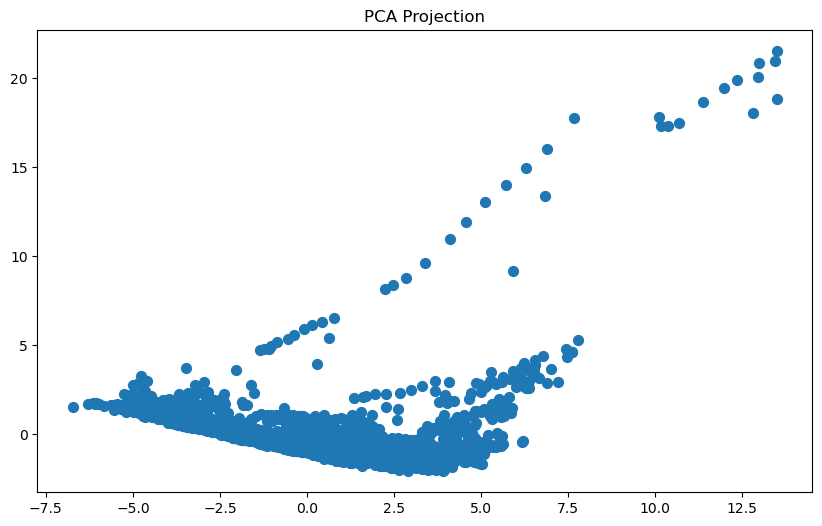

In [ ]:
# Plot the PCA result
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], s=50)
plt.title('PCA Projection')
plt.show()

# Model Building

There are various types of clustring mostly used are :

* k-means clustring
* Hierarchy clustring
* DBSCAN clustring

# K-means Clustring

### K-Means Clustering: A popular unsupervised algorithm that partitions data into 𝑘 clusters by minimizing the variance within each cluster.


In [ ]:
# Elbow method to find the optimal number of clusters for KMeans
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

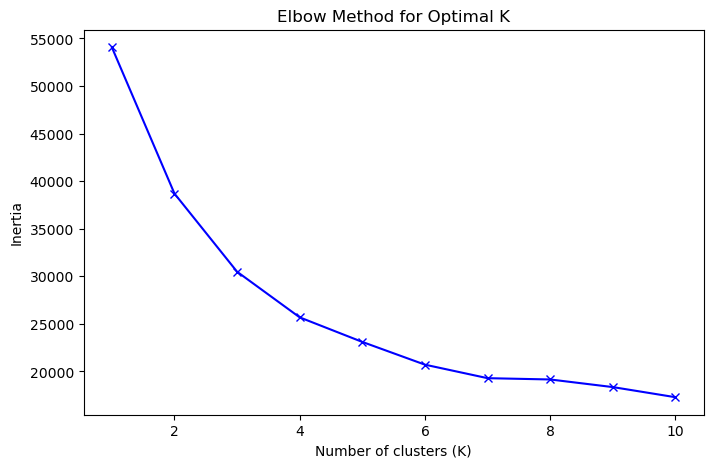

In [ ]:
# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, 'bx-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()


In [ ]:
# Apply KMeans with the optimal number of clusters (adjust 'optimal_k' based on elbow plot)
optimal_k = 3  # Replace this value based on the elbow result
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
KMeans_Cluster = kmeans.fit_predict(df_scaled)

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Assuming df_scaled is your scaled dataset
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(df_scaled)

# Add cluster labels to your DataFrame
df['KMeans_Cluster'] = kmeans.labels_

# Now compute the silhouette score
kmeans_sil_score = silhouette_score(df_scaled, df['KMeans_Cluster'])
print(f'Silhouette Score for KMeans: {kmeans_sil_score}')


Silhouette Score for KMeans: 0.3312600767588473


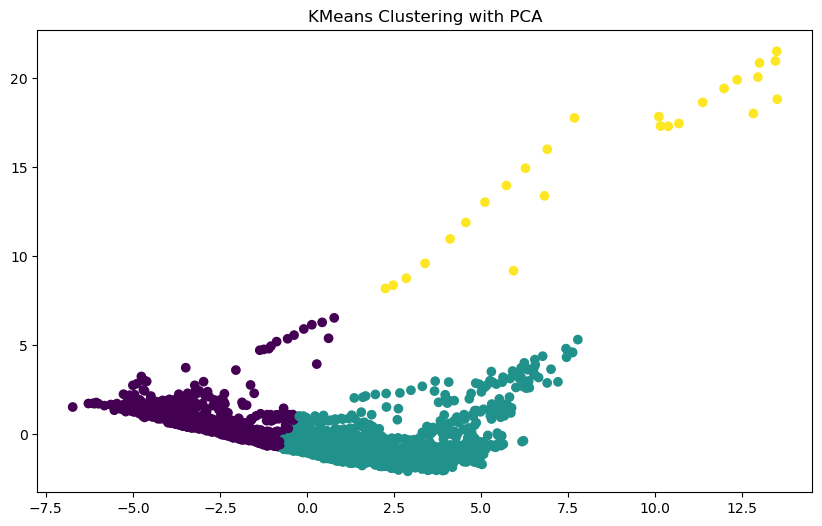

In [ ]:
# Plot KMeans Clustering Results (using PCA projection)
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df['KMeans_Cluster'], cmap='viridis')
plt.title('KMeans Clustering with PCA')
plt.show()

##### K-Means clustering with PCA: A scatter plot where the dataset was reduced to two dimensions using Principal Component Analysis (PCA) and color-coded based on K-Means cluster assignments.

# Hierarchy Clustring

In [ ]:
# Perform Hierarchical Clustering
linked = linkage(df_scaled, method='ward')

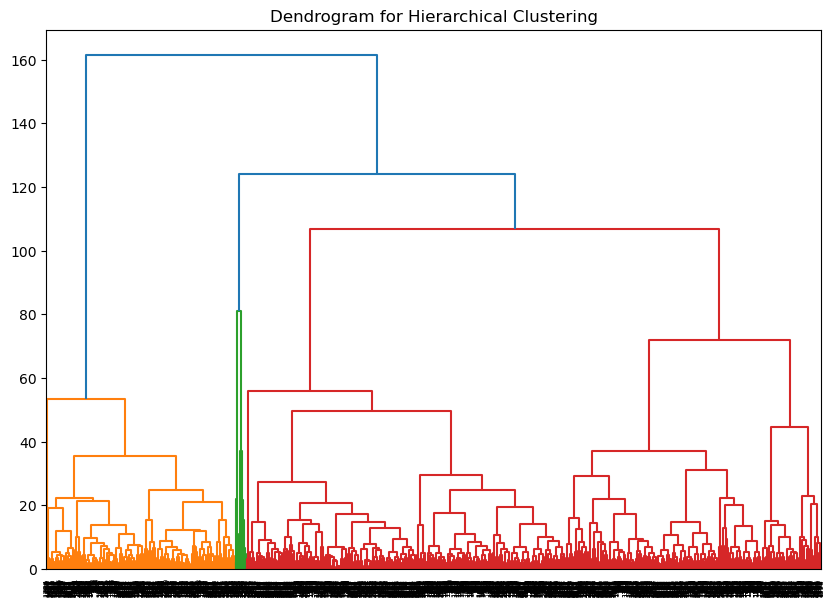

In [ ]:
# Plot dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked)
plt.title('Dendrogram for Hierarchical Clustering')
plt.show()

### Agglomerative Clustering: A hierarchical clustering method that builds clusters by merging smaller clusters based on distance metrics.

In [ ]:
# Fit Agglomerative Clustering (using the same number of clusters as KMeans)
agg_cluster = AgglomerativeClustering(n_clusters=optimal_k, metric='euclidean', linkage='ward')
df['Agglomerative_Cluster'] = agg_cluster.fit_predict(df_scaled)


In [ ]:
# Silhouette score for Agglomerative Clustering
agg_sil_score = silhouette_score(df_scaled, df['Agglomerative_Cluster'])
print(f'Silhouette Score for Agglomerative Clustering: {agg_sil_score}')

Silhouette Score for Agglomerative Clustering: 0.3199131569849132


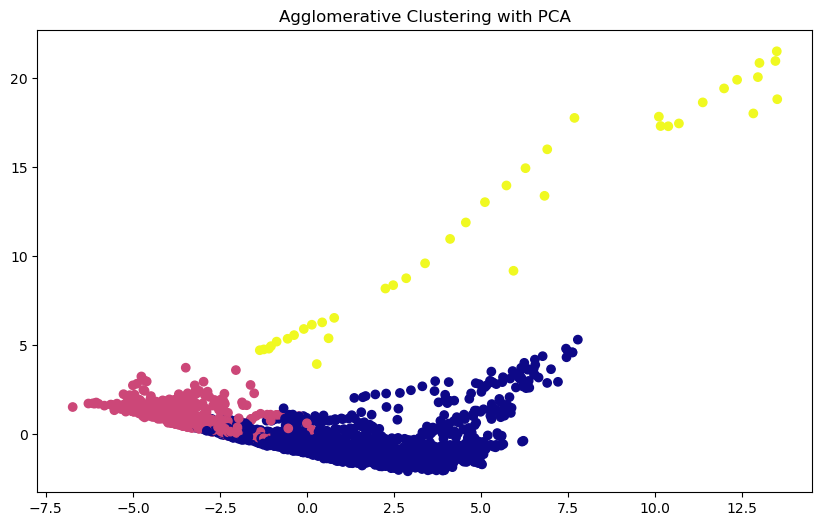

In [ ]:
# Plot Agglomerative Clustering Results (using PCA projection)
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df['Agglomerative_Cluster'], cmap='plasma')
plt.title('Agglomerative Clustering with PCA')
plt.show()

# DBSCAN

#### DBSCAN (Density-Based Spatial Clustering of Applications with Noise):
A density-based clustering algorithm that identifies core samples in dense regions and labels sparse regions as outliers.

In [ ]:
# Apply DBSCAN (Density-Based Clustering)
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust these parameters for your dataset
df['DBSCAN_Cluster'] = dbscan.fit_predict(df_scaled)

# Silhouette score for DBSCAN (only if more than one cluster is detected)
if len(set(dbscan.labels_)) > 1:
    dbscan_sil_score = silhouette_score(df_scaled, df['DBSCAN_Cluster'])
    print(f'Silhouette Score for DBSCAN: {dbscan_sil_score}')
else:
    print("DBSCAN did not find more than one cluster.")

Silhouette Score for DBSCAN: -0.43374127908863336


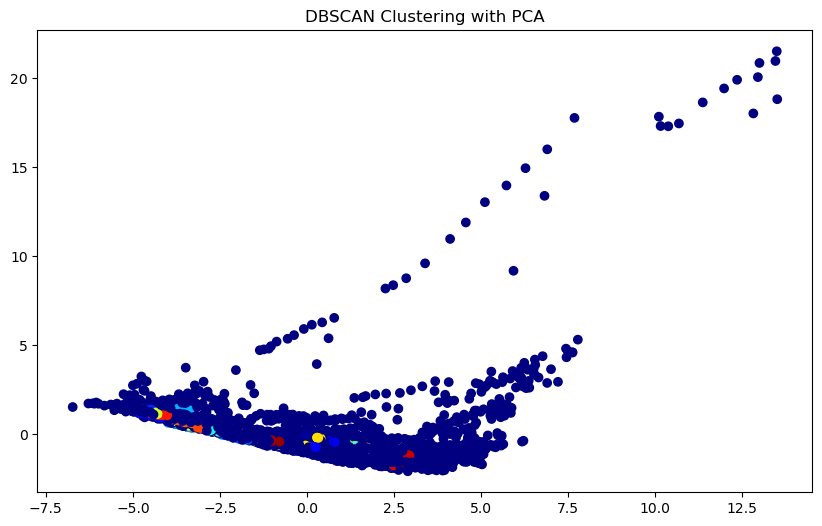

In [ ]:
# Plot DBSCAN Clustering Results (using PCA projection)
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df['DBSCAN_Cluster'], cmap='jet')
plt.title('DBSCAN Clustering with PCA')
plt.show()

##### DBSCAN clustering with PCA: Similar scatter plot for DBSCAN clustering, showing outliers and core clusters.

In [ ]:
# Compare the Silhouette Scores for KMeans, Agglomerative, and DBSCAN
print(f'KMeans Silhouette Score: {kmeans_sil_score}')
print(f'Agglomerative Clustering Silhouette Score: {agg_sil_score}')

if 'dbscan_sil_score' in locals():
    print(f'DBSCAN Silhouette Score: {dbscan_sil_score}')
else:
    print('DBSCAN did not find valid clusters for comparison.')

# Find the best method based on the highest Silhouette Score
best_method = max(kmeans_sil_score, agg_sil_score, dbscan_sil_score if 'dbscan_sil_score' in locals() else float('-inf'))

# Print the best method based on Silhouette Score
if best_method == kmeans_sil_score:
    selected_labels = KMeans_Cluster
    print("Best method: KMeans Clustering")
elif best_method == agg_sil_score:
    print("Best method: Agglomerative Clustering")
else:
    print("Best method: DBSCAN")


KMeans Silhouette Score: 0.3312600767588473
Agglomerative Clustering Silhouette Score: 0.3199131569849132
DBSCAN Silhouette Score: -0.43374127908863336
Best method: KMeans Clustering


In [ ]:
print(selected_labels)


[0 0 0 ... 1 1 1]


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Adding cluster labels to the dataset
df['Cluster'] = selected_labels

# Assuming df is your dataset and 'target_column' is your target
X = df.drop('Cluster', axis=1)
y = df['Cluster']

# One-hot encode categorical features
X = pd.get_dummies(X)

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Train the model
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
rf_acc = accuracy_score(y_test, rf_pred)
print(f'Random Forest Accuracy: {rf_acc}')

Random Forest Accuracy: 1.0


In [ ]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
knn_pred = knn.predict(X_test)
knn_acc = accuracy_score(y_test, knn_pred)
print(f"KNN Accuracy: {knn_acc}")

KNN Accuracy: 0.7726432532347505


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
gb_acc = accuracy_score(y_test, dt_pred)
print(f"Gradient Boosting Accuracy: {accuracy_score(y_test, y_pred)}")

Gradient Boosting Accuracy: 1.0


In [ ]:
# Compare the accuracy of models
model_accuracies = {
    'Random Forest': rf_acc,
    'KNN': knn_acc,
    'Gradient Boosting':gb_acc
}

best_model = max(model_accuracies, key=model_accuracies.get)
print(f"Best Model: {best_model} with accuracy {model_accuracies[best_model]}")

Best Model: Random Forest with accuracy 1.0


# Conclusion

# Results:
The performance of these models was evaluated using the Silhouette Score, which measures how similar data points are within the same cluster, and how distinct clusters are from each other. Here are the scores for the models:

* K-Means Silhouette Score: 0.331
* Agglomerative Clustering Silhouette Score: 0.319
* DBSCAN Silhouette Score: -0.434 (indicating DBSCAN had difficulties identifying meaningful clusters).

Best method: Based on the Silhouette Scores, K-Means Clustering was found to be the best-performing model.

Comparative Analysis of the Models:
* K-Means performed best, showing well-defined clusters with a moderate Silhouette Score. This method is sensitive to the initial number of clusters (
𝑘
k), which needs careful tuning.
* Agglomerative Clustering produced similar, but slightly less distinct clusters. This method is more hierarchical and merges clusters step-by-step, which may not work as well in datasets with overlapping clusters.
* DBSCAN struggled in this context, likely due to the distribution of data points. Its negative Silhouette Score suggests that it identified many outliers or couldn't form cohesive clusters.